##Set up

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install paddlepaddle paddleocr Levenshtein

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 9.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 192.8/192.8 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 92.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.7/161.7 kB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 109.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.8/297.8 kB 28.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 969.6/969.6 kB 56.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.3/244.3 kB 26.1 MB/s eta 0:00:00
  Created wheel for fire: filename=fire-0.7.0-py3-none-any.whl size=114249 sha256=67f5502fbdf44898937eee8b7cae699ddab10406fd3e65a5ac6e8606d41cff5d
  Stored in directory: /root/.cache/pip/wheels/46/54/24/1624fd5b8674eb1188623f7e8e17cdf7c0f6c24

#Library import

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image, ImageDraw, ImageFont
import numpy as np
import math
import random
import matplotlib.pyplot as plt
import cv2
import pandas as pd
import os
from sklearn.model_selection import train_test_split
import time
import traceback
from textwrap import wrap
import ast
from matplotlib.patches import Polygon, Rectangle
from paddleocr import PaddleOCR
from Levenshtein import distance as levenshtein_distance

/usr/local/lib/python3.11/dist-packages/paddle/utils/cpp_extension/extension_utils.py:711: UserWarning: No ccache found. Please be aware that recompiling all source files may be required. You can download and install ccache from: https://github.com/ccache/ccache/blob/master/doc/INSTALL.md
  warnings.warn(warning_message)


#Configuation

In [ ]:
DRIVE_PATH = '/content/drive/MyDrive/DeepLearning/Final/'
TRAIN_CSV_PATH = os.path.join(DRIVE_PATH, 'Dataset/mcocr_public/mcocr_train_data/mcocr_train_df.csv')
TRAIN_IMG_DIR = os.path.join(DRIVE_PATH, 'Dataset/mcocr_public/mcocr_train_data/train_images/')

# Path to save trained Recognition model
OUTPUT_RECOGNITION_MODEL_PATH = os.path.join(DRIVE_PATH, 'Model/best_recognition_model_mcocr_refactored.pth')

# --- Original column names in the raw CSV ---
IMAGE_ID_COLUMN = 'img_id'          # Column name for image file ID
POLYGON_COLUMN_RAW = 'anno_polygons' # Column name for raw polygon list (as string)
TEXT_COLUMN_RAW = 'anno_texts'     # Column name for raw text string ('|||' separated)

# --- New column names after processing raw CSV into individual instances ---
POLYGON_COLUMN = 'polygon_points'   # Column name for the list of points [[x0,y0],...] after parsing (Ground Truth Polygon)
TEXT_COLUMN = 'text'                # Column name for the cleaned text string (Ground Truth Text)

# Constants
IMG_HEIGHT = 64         # Target height for cropped image regions for Recognition
IMG_WIDTH = 256         # Target width for cropped image regions for Recognition
MAX_LEN = 150           # Maximum length of the token sequence (including SOS/EOS/PAD) - Adjust based on data
BATCH_SIZE = 32         # Decrease if CUDA memory error occurs
EPOCHS = 50             # Number of training epochs (increase for better results)
LEARNING_RATE = 1e-4    # Learning rate
VALIDATION_SPLIT = 0.1  # Fraction of data for validation
TEST_SPLIT = 0.1        # Fraction of data for test (for Recognition evaluation)
RANDOM_STATE = 42       # For reproducible data split
NUM_WORKERS = 4         # Number of subprocesses for data loading (increase if CPU is bottleneck)

# Model Hyperparameters
D_MODEL = 256           # Dimension of embeddings and Transformer layers
NHEAD = 8               # Number of attention heads in Transformer
NUM_DECODER_LAYERS = 4  # Number of Transformer Decoder layers
DIM_FEEDFORWARD = 1024  # Dimension of the feedforward network model
DROPOUT = 0.1           # Dropout rate
CNN_OUTPUT_DIM = D_MODEL # Ensure CNN output dimension matches D_MODEL

# Device configuration
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")
print("-" * 30)

Using device: cuda
------------------------------


In [ ]:
def extract_valid_polygon(segmentation):
    try:
        # Case where segmentation is a list containing one flat list: [[x1, y1, x2, y2, ...]]
        if isinstance(segmentation, list) and len(segmentation) > 0:
            flat_points = segmentation[0]
            # Check if the inner list is a list and has at least 3 points (6 coordinates) and even length
            if isinstance(flat_points, list) and len(flat_points) >= 6 and len(flat_points) % 2 == 0:
                # Convert to list of integer point pairs [[x1, y1], [x2, y2], ...]
                points = [[int(flat_points[i]), int(flat_points[i+1])] for i in range(0, len(flat_points), 2)]
                # Ensure it's actually a list of list of two numbers
                if all(isinstance(p, list) and len(p) == 2 and
                       all(isinstance(coord, (int, float)) for coord in p) # Allow float then convert to int
                       for p in points):
                    return points
        # Less common case for mcocr, but handle if segmentation is already [[x1, y1], [x2, y2], ...]
        elif isinstance(segmentation, list) and len(segmentation) >= 3: # Minimum 3 points for a valid polygon
             if all(isinstance(p, list) and len(p) == 2 and
                       all(isinstance(coord, (int, float)) for coord in p)
                       for p in segmentation):
                 return [[int(p[0]), int(p[1])] for p in segmentation] # Ensure integer points

    except Exception as e:
        pass
    return None

#Preprocessing data

In [ ]:
# --- 2. Load, Parse, and Process ORIGINAL Data ---
print("Loading and processing original annotations...")
df_processed = None

try:
    # Step 1: Read the raw CSV containing Ground Truth
    df_raw = pd.read_csv(TRAIN_CSV_PATH)
    print(f"Raw CSV loaded: {len(df_raw)} rows.")

    # Check for essential columns
    required_raw_cols = [IMAGE_ID_COLUMN, POLYGON_COLUMN_RAW, TEXT_COLUMN_RAW]
    missing_raw_cols = [col for col in required_raw_cols if col not in df_raw.columns]
    if missing_raw_cols:
        raise ValueError(f"Missing required columns in raw CSV: {missing_raw_cols}")

    # Drop rows with NaN values in critical columns early
    df_raw = df_raw.dropna(subset=required_raw_cols).reset_index(drop=True)
    print(f"Rows after dropping NaN in required columns: {len(df_raw)}")

    # Step 2 & 3: Parse polygon and text columns from RAW data, pair them, and build a new DataFrame.
    # Each row in the new DataFrame will represent one Ground Truth text instance
    processed_data = []
    parsing_errors = 0
    length_mismatches = 0
    empty_text_skipped = 0
    invalid_polygon_skipped = 0

    for index, row in df_raw.iterrows():
        img_id = row[IMAGE_ID_COLUMN]
        poly_str = str(row[POLYGON_COLUMN_RAW])
        text_concat_str = str(row[TEXT_COLUMN_RAW])

        try:
            poly_info_list = ast.literal_eval(poly_str)
            # Split the concatenated text string
            texts_list = text_concat_str.split('|||')
            # Basic type check after parsing
            if not isinstance(poly_info_list, list) or not isinstance(texts_list, list):
                 parsing_errors += 1
                 continue

            # Check if the number of polygon infos matches the number of text strings
            if len(poly_info_list) == len(texts_list):
                # Iterate through each polygon-text pair for this image using Ground Truth
                for poly_info, text in zip(poly_info_list, texts_list):
                    text_cleaned = str(text).strip()
                    if not text_cleaned:
                        empty_text_skipped += 1
                        continue

                    # Extract the 'segmentation' list from the polygon info dictionary
                    if isinstance(poly_info, dict) and 'segmentation' in poly_info:
                        # Extract and validate the GROUND TRUTH polygon points
                        polygon_points = extract_valid_polygon(poly_info.get('segmentation'))
                        if polygon_points:
                            processed_data.append({
                                IMAGE_ID_COLUMN: img_id,
                                POLYGON_COLUMN: polygon_points, # Store the list of GROUND TRUTH points
                                TEXT_COLUMN: text_cleaned      # Store the cleaned GROUND TRUTH text
                            })
                        else:
                            invalid_polygon_skipped += 1
                    else:
                         invalid_polygon_skipped += 1
            else:
                length_mismatches += 1 # Count images where lists don't match

        except (ValueError, SyntaxError, TypeError) as parse_err:
            parsing_errors += 1 # Count images with parsing errors
        except Exception as e:
            # Catch any other unexpected errors during row processing
            print(f"Unexpected error processing row for {img_id}: {e}")
            traceback.print_exc() # Print the full traceback for unexpected errors
            parsing_errors += 1

    print(f"Original Data Processing complete.")
    print(f"  - Parsing/Structure errors (per image row in raw CSV): {parsing_errors}")
    print(f"  - Polygon/Text count mismatches (per image row in raw CSV): {length_mismatches}")
    print(f"  - Skipped GROUND TRUTH instances with empty text: {empty_text_skipped}")
    print(f"  - Skipped GROUND TRUTH instances with invalid/unparsable polygon structures: {invalid_polygon_skipped}")

    # Step 4: Create the new DataFrame from the processed list
    df_processed_gt = pd.DataFrame(processed_data)

    # Final check if any data was successfully processed
    if len(df_processed_gt) == 0:
        raise ValueError("No valid Ground Truth data pairs (polygon, text) found after processing original CSV. Check your CSV format, content, and parsing logic.")

    print(f"Processed DataFrame (Ground Truth Instances) created with {len(df_processed_gt)} rows.")
    print(df_processed_gt.head()) # Print first few rows to check
    print("-" * 30)

except FileNotFoundError:
    print(f"Training CSV file not found at {TRAIN_CSV_PATH}")
    exit(1) # Exit script if CSV is not found
except ValueError as ve:
    print(f"Error during original data processing: {ve}")
    exit(1) # Exit script for critical processing errors
except Exception as e:
    print(f"An unexpected error occurred during original data loading/processing: {e}")
    traceback.print_exc() # Print traceback for unexpected errors
    exit(1) # Exit script

Loading and processing original annotations...
Raw CSV loaded: 1155 rows.
Rows after dropping NaN in required columns: 1153
Original Data Processing complete.
  - Parsing/Structure errors (per image row in raw CSV): 0
  - Polygon/Text count mismatches (per image row in raw CSV): 0
  - Skipped GROUND TRUTH instances with empty text: 0
  - Skipped GROUND TRUTH instances with invalid/unparsable polygon structures: 0
Processed DataFrame (Ground Truth Instances) created with 6585 rows.
                         img_id  \
0  mcocr_public_145013ddcph.jpg   
1  mcocr_public_145013ddcph.jpg   
2  mcocr_public_145013ddcph.jpg   
3  mcocr_public_145013ddcph.jpg   
4  mcocr_public_145013ddcph.jpg   

                                      polygon_points                     text  
0  [[231, 80], [467, 82], [469, 109], [232, 107],...            MINIMART ANAN  
1   [[496, 123], [497, 146], [199, 143], [201, 120]]  Chợ Sủi Phú Thị Gia Lâm  
2  [[403, 983], [653, 973], [659, 1008], [407, 10...  Ngày : 11

#Split Data into Train, Val, and Test Sets

In [ ]:
print(f"Splitting processed Ground Truth data into train/validation/test...")
if df_processed_gt is not None and not df_processed_gt.empty:
    train_df_gt, temp_df_gt = train_test_split(
        df_processed_gt,
        test_size=VALIDATION_SPLIT + TEST_SPLIT,
        random_state=RANDOM_STATE,
    )
    # Calculate the fraction of the remaining data that should be for the test set
    test_size_fraction = TEST_SPLIT / (VALIDATION_SPLIT + TEST_SPLIT) if (VALIDATION_SPLIT + TEST_SPLIT) > 0 else 0
    val_df_gt, test_df_gt = train_test_split(
        temp_df_gt,
        test_size=test_size_fraction,
        random_state=RANDOM_STATE
    )

    # Reset indices for cleaner DataFrame usage
    train_df_gt = train_df_gt.reset_index(drop=True)
    val_df_gt = val_df_gt.reset_index(drop=True)
    test_df_gt = test_df_gt.reset_index(drop=True)

    print(f"Train: {len(train_df_gt)}")
    print(f"Validation: {len(val_df_gt)}")
    print(f"Test: {len(test_df_gt)}")

    # Select a few unique image IDs from the test set for end-to-end visualization later
    if not test_df_gt.empty:
        test_image_ids_for_viz = test_df_gt[IMAGE_ID_COLUMN].unique()
        NUM_VIZ_IMAGES = min(5, len(test_image_ids_for_viz))
        test_image_ids_for_viz = np.random.choice(test_image_ids_for_viz, NUM_VIZ_IMAGES, replace=False).tolist()
        print(f"Selected {NUM_VIZ_IMAGES} unique image IDs from test set for end-to-end visualization.")
    else:
        test_image_ids_for_viz = []
        print("Test set is empty. Cannot select images for end-to-end visualization.")

    print("-" * 30)
else:
    print("Error: Cannot split data because df_processed_gt is empty or None. Exiting.")
    exit(1)

Splitting processed Ground Truth data into train/validation/test...
Train: 5268
Validation: 658
Test: 659
Selected 5 unique image IDs from test set for end-to-end visualization.
------------------------------


#Build Vocabulary

In [ ]:
print("Building vocabulary from Ground Truth data...")
all_chars = set()
longest_seq = 0
# Build vocab from the text in the full processed GT dataframe
if df_processed_gt is not None and not df_processed_gt.empty:
    for text in df_processed_gt[TEXT_COLUMN]:
        if isinstance(text, str):
            all_chars.update(list(text))
            longest_seq = max(longest_seq, len(text))
        else:
             print(f"Warning: Found non-string text during vocab build: {text} (type: {type(text)})")

    vocab = ["[SOS]", "[EOS]", "[PAD]", "[UNK]"] + sorted(list(all_chars))
    char_to_idx = {char: idx for idx, char in enumerate(vocab)}
    idx_to_char = {idx: char for idx, char in enumerate(vocab)}
    VOCAB_SIZE = len(vocab)

    SOS_TOKEN = char_to_idx["[SOS]"]
    EOS_TOKEN = char_to_idx["[EOS]"]
    PAD_TOKEN = char_to_idx["[PAD]"]
    UNK_TOKEN = char_to_idx["[UNK]"]

    print(f"Vocabulary size: {VOCAB_SIZE}")
    print(f"Longest sequence found in GT data: {longest_seq} characters.")
    if longest_seq + 2 > MAX_LEN:
        print(f"Warning: MAX_LEN ({MAX_LEN}) might be too small ({longest_seq} + SOS/EOS). Consider increasing MAX_LEN.")
    else:
        print(f"MAX_LEN ({MAX_LEN}) seems sufficient for sequences up to length {longest_seq}.")
    print("-" * 30)
else:
    print("Error: Cannot build vocabulary because df_processed_gt is empty or None. Exiting.")
    exit(1)

Building vocabulary from Ground Truth data...
Vocabulary size: 185
Longest sequence found in GT data: 139 characters.
MAX_LEN (150) seems sufficient for sequences up to length 139.
------------------------------


#Define Model

In [ ]:
class PositionalEncoding(nn.Module):
    def __init__(self, d_model: int, dropout: float = 0.1, max_len: int = 5000):
        super().__init__()
        self.dropout = nn.Dropout(p=dropout)
        position = torch.arange(max_len).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2) * (-math.log(10000.0) / d_model))
        pe = torch.zeros(max_len, d_model)
        pe[:, 0::2] = torch.sin(position * div_term)
        if d_model % 2 != 0:
            pe[:, 1::2] = torch.cos(position * div_term[:pe[:, 1::2].size(1)])
        else:
            pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        seq_len = x.size(0)
        if seq_len > self.pe.size(0):
            raise ValueError(f"Sequence length ({seq_len}) exceeds max_len ({self.pe.size(0)}).")
        x = x + self.pe[:seq_len]
        return self.dropout(x)

class EncoderCNN(nn.Module):
    def __init__(self, output_dim):
        super().__init__()
        # Input image shape: (B, 1, IMG_HEIGHT, IMG_WIDTH)
        self.cnn = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=3, stride=1, padding=1), nn.BatchNorm2d(64), nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2), # Output: (B, 64, H/2, W/2)
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1), nn.BatchNorm2d(128), nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2), # Output: (B, 128, H/4, W/4)
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1), nn.BatchNorm2d(256), nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1), nn.BatchNorm2d(256), nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=(2, 1), stride=(2, 1)), # Reduce H only
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1, bias=False), nn.BatchNorm2d(512), nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1, bias=False), nn.BatchNorm2d(512), nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=(2, 1), stride=(2, 1)), # Reduce H only
            # Final layer to reduce height to 1 and potentially adjust width with padding
            nn.Conv2d(512, 512, kernel_size=(4, 3), stride=(1, 1), padding=(0, 1), bias=False), nn.BatchNorm2d(512), nn.ReLU(inplace=True) # Assuming input H=4, W=64 -> Output H=1, W=64
        )
        self.projection = nn.Linear(512, output_dim) # output_dim should be D_MODEL

    def forward(self, x):
        features = self.cnn(x)
        features = features.squeeze(2) # Remove height dim (B, 512, W')
        features = features.permute(0, 2, 1) # (B, W', 512)
        features = self.projection(features) # (B, W', output_dim)
        features = features.permute(1, 0, 2) # (W', B, output_dim) - SeqLen, Batch, Dim
        return features

class DecoderTransformer(nn.Module):
    def __init__(self, vocab_size, d_model, nhead, num_decoder_layers, dim_feedforward, dropout=0.1, max_len=MAX_LEN + 5):
        super().__init__()
        self.d_model = d_model
        self.vocab_size = vocab_size
        self.embedding = nn.Embedding(vocab_size, d_model, padding_idx=PAD_TOKEN)
        self.pos_encoder = PositionalEncoding(d_model, dropout, max_len=max_len)
        # batch_first=False -> (SeqLen, Batch, Features)
        decoder_layer = nn.TransformerDecoderLayer(
            d_model=d_model, nhead=nhead, dim_feedforward=dim_feedforward, dropout=dropout,
            activation='relu', batch_first=False, norm_first=True
        )
        decoder_norm = nn.LayerNorm(d_model)
        self.transformer_decoder = nn.TransformerDecoder(decoder_layer, num_decoder_layers, norm=decoder_norm)
        self.fc_out = nn.Linear(d_model, vocab_size)
        self._init_weights()

    def _init_weights(self):
        initrange = 0.1
        self.embedding.weight.data.uniform_(-initrange, initrange)
        self.fc_out.bias.data.zero_()
        self.fc_out.weight.data.uniform_(-initrange, initrange)

    def generate_square_subsequent_mask(self, sz: int, device: torch.device) -> torch.Tensor:
        mask = (torch.triu(torch.ones(sz, sz, device=device)) == 1).transpose(0, 1)
        mask = mask.float().masked_fill(mask == 0, float('-inf')).masked_fill(mask == 1, float(0.0))
        return mask

    def forward(self, tgt: torch.Tensor, memory: torch.Tensor,
                tgt_mask: torch.Tensor = None,
                tgt_key_padding_mask: torch.Tensor = None,
                memory_key_padding_mask: torch.Tensor = None) -> torch.Tensor:
        tgt_emb = self.embedding(tgt) * math.sqrt(self.d_model)
        tgt_pos = self.pos_encoder(tgt_emb)
        if tgt_mask is None:
            tgt_mask = self.generate_square_subsequent_mask(tgt.size(0), tgt.device)

        output = self.transformer_decoder(tgt_pos, memory,
                                          tgt_mask=tgt_mask,
                                          memory_mask=None,
                                          tgt_key_padding_mask=tgt_key_padding_mask,
                                          memory_key_padding_mask=memory_key_padding_mask)
        output = self.fc_out(output)
        return output

class OCRModel(nn.Module):
    def __init__(self, encoder: EncoderCNN, decoder: DecoderTransformer, cnn_output_dim: int, d_model: int, max_cnn_len=100):
        super().__init__()
        self.encoder = encoder
        self.decoder = decoder
        self.cnn_pos_encoder = PositionalEncoding(cnn_output_dim, dropout=0.1, max_len=max_cnn_len)

    def forward(self, src_img: torch.Tensor, tgt_seq: torch.Tensor, tgt_key_padding_mask: torch.Tensor = None) -> torch.Tensor:
        memory = self.encoder(src_img)
        memory = self.cnn_pos_encoder(memory)
        output = self.decoder(tgt_seq, memory, tgt_key_padding_mask=tgt_key_padding_mask)
        return output

    def encode(self, src_img: torch.Tensor) -> torch.Tensor:
        memory = self.encoder(src_img)
        memory = self.cnn_pos_encoder(memory)
        return memory

    def decode(self, tgt_seq: torch.Tensor, memory: torch.Tensor, tgt_mask: torch.Tensor = None, tgt_key_padding_mask: torch.Tensor = None) -> torch.Tensor:
        return self.decoder(tgt_seq, memory, tgt_mask=tgt_mask, tgt_key_padding_mask=tgt_key_padding_mask)


#Dataset and Dataloader

In [ ]:
class OCRDataset(Dataset):
    def __init__(self, df: pd.DataFrame, img_dir: str, char_to_idx: dict, max_len: int,
                 img_height: int, img_width: int):
        self.df = df
        self.img_dir = img_dir
        self.char_to_idx = char_to_idx
        self.max_len = max_len
        self.img_height = img_height
        self.img_width = img_width

        self.pad_token = self.char_to_idx['[PAD]']
        self.sos_token = self.char_to_idx['[SOS]']
        self.eos_token = self.char_to_idx['[EOS]']
        self.unk_token = self.char_to_idx['[UNK]']

        # Define image transformations for cropped regions
        self.transform = transforms.Compose([
            transforms.Resize((self.img_height, self.img_width), interpolation=transforms.InterpolationMode.BILINEAR),
            transforms.ToTensor(), # Converts PIL Image (H, W, C) or (H, W) to Tensor (C, H, W) and scales [0, 1]
            transforms.Normalize(mean=[0.5], std=[0.5]) # Normalize to [-1, 1] for grayscale images
        ])

    def __len__(self) -> int:
        return len(self.df)

    def __getitem__(self, idx: int):
        if idx < 0 or idx >= len(self.df):
            return None

        row = self.df.iloc[idx]
        img_filename = row[IMAGE_ID_COLUMN]
        polygon_points = row[POLYGON_COLUMN] if isinstance(row[POLYGON_COLUMN], list) else None
        text = str(row[TEXT_COLUMN])
        img_path = os.path.join(self.img_dir, img_filename)

        try:
            # Open the original full image in grayscale
            full_img = Image.open(img_path).convert('L')

            if polygon_points is None:
                 return None

            points = np.array(polygon_points, dtype=np.float32)
            # Additional robustness check for polygon format
            if points.ndim != 2 or points.shape[1] != 2 or points.shape[0] < 3:
                 return None
            # Calculate min/max coordinates to get bounding box
            xmin = int(np.min(points[:, 0])); ymin = int(np.min(points[:, 1]))
            xmax = int(np.max(points[:, 0])); ymax = int(np.max(points[:, 1]))

            # Clamp coordinates to image boundaries
            img_width, img_height = full_img.size # PIL uses (width, height)
            xmin = max(0, xmin); ymin = max(0, ymin)
            xmax = min(img_width, xmax); ymax = min(img_height, ymax)

            # Ensure bounding box is valid (positive width and height)
            if xmin >= xmax or ymin >= ymax:
                 return None # Skip if bbox is invalid

            # Crop the image region based on the bounding box derived from GT polygon
            cropped_img = full_img.crop((xmin, ymin, xmax, ymax))

            # Apply image transformations (resize, to tensor, normalize)
            img_tensor = self.transform(cropped_img) # Shape: (1, H, W) for grayscale

            # --- Tokenize GROUND TRUTH Text ---
            tokens = [self.sos_token] + \
                     [self.char_to_idx.get(char, self.unk_token) for char in text] + \
                     [self.eos_token]

            # Pad or truncate the token sequence to max_len
            if len(tokens) > self.max_len:
                 tokens = tokens[:self.max_len-1] + [self.eos_token]
                 #print(f"Warning: Text sequence too long for {img_filename} at index {idx}. Truncating.") # Uncomment for debugging

            padded_tokens = tokens + [self.pad_token] * (self.max_len - len(tokens))
            token_tensor = torch.LongTensor(padded_tokens) # Shape: (max_len,)

            # Return the processed cropped image tensor and the token tensor
            return img_tensor, token_tensor

        except FileNotFoundError:
            print(f"Warning: Image file not found {img_path}. Skipping sample index {idx}.")
            return None
        except Exception as e:
            print(f"Warning: Error processing sample {idx} ({img_filename}): {e}.")
            traceback.print_exc()
            return None

# --- Custom collate_fn for DataLoader ---
def collate_fn(batch):
    batch = [item for item in batch if item is not None]
    if not batch:
        return None, None, None, None
    try:
        images, targets = zip(*batch)
        images = torch.stack(images, 0) # Shape: (B, 1, H, W)
        targets = torch.stack(targets, 0) # Shape: (B, max_len)

        # Decoder input is targets shifted right (SOS + tokens)
        # Target output for loss is tokens + EOS/PAD
        decoder_input_indices = targets[:, :-1] # Shape: (B, max_len - 1)
        target_output_indices = targets[:, 1:] # Shape: (B, max_len - 1)

        # Create padding mask for decoder input
        tgt_padding_mask = (decoder_input_indices == PAD_TOKEN) # Shape: (B, max_len - 1)

        # Permute decoder input for Transformer (SeqLen, Batch)
        decoder_input_indices = decoder_input_indices.permute(1, 0)

        # target_output_indices can remain (B, T) and reshaped during loss
        return images, decoder_input_indices, target_output_indices, tgt_padding_mask

    except Exception as e:
        print(f"Error in collate_fn: {e}")
        traceback.print_exc()
        return None, None, None, None


# Create datasets and dataloaders using the processed Ground Truth DataFrames
if 'train_df_gt' in globals() and 'val_df_gt' in globals() and 'test_df_gt' in globals() and train_df_gt is not None and val_df_gt is not None and test_df_gt is not None:
    print("Creating Datasets and DataLoaders...")
    train_dataset = OCRDataset(train_df_gt, TRAIN_IMG_DIR, char_to_idx, MAX_LEN, IMG_HEIGHT, IMG_WIDTH)
    val_dataset = OCRDataset(val_df_gt, TRAIN_IMG_DIR, char_to_idx, MAX_LEN, IMG_HEIGHT, IMG_WIDTH)
    test_dataset_rec = OCRDataset(test_df_gt, TRAIN_IMG_DIR, char_to_idx, MAX_LEN, IMG_HEIGHT, IMG_WIDTH) # Renamed for clarity (Recognition test)

    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collate_fn, num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, collate_fn=collate_fn, num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())
    test_loader_rec = DataLoader(test_dataset_rec, batch_size=BATCH_SIZE, shuffle=False, collate_fn=collate_fn, num_workers=NUM_WORKERS, pin_memory=torch.cuda.is_available())

    print(f"DataLoaders created: Train batches: {len(train_loader)}, Val batches: {len(val_loader)}, Test (Rec) batches: {len(test_loader_rec)}")
    print("-" * 30)
else:
    print("Error: Cannot create Datasets/DataLoaders because GT DataFrames are missing or empty. Exiting.")
    exit(1)

Creating Datasets and DataLoaders...
DataLoaders created: Train batches: 165, Val batches: 21, Test (Rec) batches: 21
------------------------------


In [ ]:
print("Instantiating Recognition model...")
cnn_feature_width = IMG_WIDTH // (2*2) # Based on width strides (256 -> 128 -> 64)
encoder = EncoderCNN(output_dim=CNN_OUTPUT_DIM).to(DEVICE)
decoder = DecoderTransformer(VOCAB_SIZE, D_MODEL, NHEAD, NUM_DECODER_LAYERS, DIM_FEEDFORWARD, DROPOUT, max_len=MAX_LEN).to(DEVICE)
model = OCRModel(encoder, decoder, CNN_OUTPUT_DIM, D_MODEL, max_cnn_len=cnn_feature_width + 10).to(DEVICE) # Add buffer to max_cnn_len
print(f"Recognition Model parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}")
print("-" * 30)

Instantiating Recognition model...
Recognition Model parameters: 12,089,401
------------------------------


#Initialize PaddleOCR for Detection

In [ ]:
print("\n--- Initializing PaddleOCR Detector ---")
ocr_detector = None
try:
    ocr_detector = PaddleOCR(lang='vi', det=True, rec=False, use_angle_cls=False, use_gpu=torch.cuda.is_available(), show_log=False)
    print("PaddleOCR Detector initialized successfully.")
except Exception as e:
    print(f"CRITICAL Error initializing PaddleOCR Detector: {e}")
    traceback.print_exc()
    ocr_detector = None
print("-" * 50)


--- Initializing PaddleOCR Detector ---
PaddleOCR Detector initialized successfully.
--------------------------------------------------


#Training and Evaluation

In [ ]:
optimizer = optim.AdamW(model.parameters(), lr=LEARNING_RATE, weight_decay=0.01)
criterion = nn.CrossEntropyLoss(ignore_index=PAD_TOKEN)

def train_epoch(model: OCRModel, loader: DataLoader, optimizer: optim.Optimizer,
                criterion: nn.CrossEntropyLoss, device: torch.device, epoch_num: int,
                clip_grad: float = 1.0) -> float:
    model.train()
    epoch_loss = 0.0
    processed_batches = 0
    batches_skipped = 0
    for batch_idx, batch_data in enumerate(loader):
        if batch_data[0] is None:
            batches_skipped += 1
            continue
        src_img, decoder_input, target_output, tgt_padding_mask = batch_data
        src_img, decoder_input, target_output, tgt_padding_mask = src_img.to(device), decoder_input.to(device), target_output.to(device), tgt_padding_mask.to(device)
        optimizer.zero_grad()
        output = model(src_img, decoder_input, tgt_key_padding_mask=tgt_padding_mask)
        output_flat = output.permute(1, 0, 2).reshape(-1, VOCAB_SIZE)
        target_flat = target_output.reshape(-1)
        loss = criterion(output_flat, target_flat)
        if not torch.isnan(loss) and not torch.isinf(loss):
            loss.backward()
            if clip_grad > 0:
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=clip_grad)
            optimizer.step()
            epoch_loss += loss.item()
            processed_batches += 1
        if (batch_idx + 1) % 100 == 0 and processed_batches > 0:
            print(f"Epoch {epoch_num} - Batch {batch_idx+1}/{len(loader)} - Avg Loss: {epoch_loss/processed_batches:.4f}")
    if batches_skipped > 0:
        print(f"Epoch {epoch_num}: Skipped {batches_skipped} batches.")
    return epoch_loss / processed_batches if processed_batches > 0 else 0.0

def calculate_cer(preds: list[str], targets: list[str]) -> float:
    total_cer_norm = 0.0
    count = 0
    min_len = min(len(preds), len(targets))
    if min_len == 0:
        return 1.0

    preds = preds[:min_len]
    targets = targets[:min_len]

    for pred, target in zip(preds, targets):
        # Use imported levenshtein_distance
        errors = levenshtein_distance(pred, target)
        total_cer_norm += errors / max(1, len(target))
        count += 1
    return total_cer_norm / count if count > 0 else 1.0

def decode_sequence(indices: list[int], idx_to_char: dict) -> str:
    chars = []
    for idx in indices:
        if idx == EOS_TOKEN:
            break
        if idx == SOS_TOKEN or idx == PAD_TOKEN:
            continue
        chars.append(idx_to_char.get(idx, '?'))
    return "".join(chars)

def evaluate_recognition(model, loader, criterion, device, idx_to_char, max_len_decode=MAX_LEN):
    model.eval()
    total_loss = 0.0
    all_preds = []
    all_targets_raw = []
    processed_batches = 0
    batches_skipped = 0
    with torch.no_grad():
        for batch_idx, batch_data in enumerate(loader):
            if batch_data[0] is None:
                batches_skipped += 1
                continue
            src_img, decoder_input_eval, target_output_eval, tgt_padding_mask_eval = batch_data
            src_img = src_img.to(device)
            target_output_eval = target_output_eval.to(device)
            decoder_input_eval = decoder_input_eval.to(device) # Need this for loss calc
            tgt_padding_mask_eval = tgt_padding_mask_eval.to(device) # Need this for loss calc
            batch_size = src_img.size(0)

            # --- Perform Greedy Decoding ---
            memory = model.encode(src_img)
            ys = torch.ones(1, batch_size).fill_(SOS_TOKEN).long().to(device)
            ended = torch.zeros(batch_size, dtype=torch.bool).to(device)

            for i in range(max_len_decode - 1):
                tgt_mask = model.decoder.generate_square_subsequent_mask(ys.size(0), device)
                output = model.decode(ys, memory, tgt_mask=tgt_mask) # No padding mask needed for inference seq
                pred_token_idx = output[-1, :, :].argmax(dim=-1)
                pred_token_idx = pred_token_idx.masked_fill(ended, PAD_TOKEN) # Mask ended sequences
                ys = torch.cat([ys, pred_token_idx.unsqueeze(0)], dim=0)
                just_ended = (pred_token_idx == EOS_TOKEN)
                ended = ended | just_ended
                if ended.all():
                    break

            # Convert predictions and targets to strings
            for b in range(batch_size):
                pred_indices = ys[1:, b].cpu().tolist()
                all_preds.append(decode_sequence(pred_indices, idx_to_char))
                target_indices = target_output_eval[b, :].cpu().tolist()
                all_targets_raw.append(decode_sequence(target_indices, idx_to_char))

            # --- Calculate Loss for this batch ---
            # Run forward pass with original decoder input and padding mask
            output_for_loss = model(src_img, decoder_input_eval, tgt_key_padding_mask=tgt_padding_mask_eval)
            output_flat_loss = output_for_loss.permute(1, 0, 2).reshape(-1, VOCAB_SIZE)
            target_flat_loss = target_output_eval.reshape(-1)
            loss = criterion(output_flat_loss, target_flat_loss)

            if not torch.isnan(loss) and not torch.isinf(loss):
                total_loss += loss.item()

            processed_batches += 1

    if batches_skipped > 0:
        print(f"Evaluation: Skipped {batches_skipped} batches.")

    avg_loss = total_loss / processed_batches if processed_batches > 0 else 0.0
    cer = calculate_cer(all_preds, all_targets_raw)
    correct_sequences = sum(1 for pred, target in zip(all_preds, all_targets_raw) if pred == target)
    accuracy = correct_sequences / len(all_targets_raw) if all_targets_raw else 0.0

    return avg_loss, cer, accuracy, all_preds, all_targets_raw

#Training loop


--- Starting Training Model ---
Epoch 1 - Batch 100/165 - Avg Loss: 2.9301
------------------------------
Epoch 1/50 Summary | Time: 158.02s
  Train Loss: 2.4700
  Val Loss  : 1.4548
  Val CER   : 0.7246
  Val Acc   : 0.1109
  ** Best Val CER improved to 0.7246. Saved model to /content/drive/MyDrive/DeepLearning/Final/Model/best_recognition_model_mcocr_refactored.pth **
------------------------------
Epoch 2 - Batch 100/165 - Avg Loss: 1.3958
------------------------------
Epoch 2/50 Summary | Time: 71.62s
  Train Loss: 1.3039
  Val Loss  : 0.9797
  Val CER   : 0.6374
  Val Acc   : 0.1733
  ** Best Val CER improved to 0.6374. Saved model to /content/drive/MyDrive/DeepLearning/Final/Model/best_recognition_model_mcocr_refactored.pth **
------------------------------
Epoch 3 - Batch 100/165 - Avg Loss: 0.9965
------------------------------
Epoch 3/50 Summary | Time: 62.76s
  Train Loss: 0.9723
  Val Loss  : 0.7419
  Val CER   : 0.4186
  Val Acc   : 0.2447
  ** Best Val CER improved to 0.

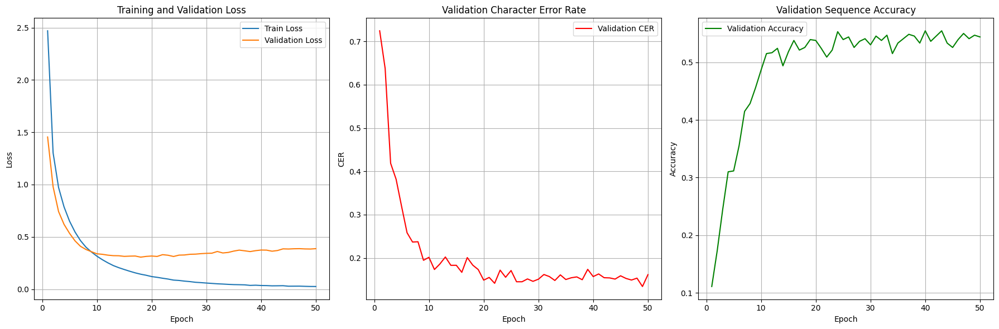

--------------------------------------------------


In [ ]:
print("\n--- Starting Training Model ---")
best_val_cer = float('inf')
train_losses, val_losses, val_cers, val_accuracies = [], [], [], []

if 'train_loader' in globals() and 'val_loader' in globals() and train_loader is not None and val_loader is not None:
    for epoch in range(1, EPOCHS + 1):
        epoch_start_time = time.time()
        train_loss = train_epoch(model, train_loader, optimizer, criterion, DEVICE, epoch)
        val_loss, val_cer, val_acc, _, _ = evaluate_recognition(model, val_loader, criterion, DEVICE, idx_to_char)
        train_losses.append(train_loss)
        val_losses.append(val_loss)
        val_cers.append(val_cer)
        val_accuracies.append(val_acc)

        epoch_duration = time.time() - epoch_start_time
        print("-" * 30)
        print(f"Epoch {epoch}/{EPOCHS} Summary | Time: {epoch_duration:.2f}s")
        print(f"  Train Loss: {train_loss:.4f}")
        print(f"  Val Loss  : {val_loss:.4f}")
        print(f"  Val CER   : {val_cer:.4f}")
        print(f"  Val Acc   : {val_acc:.4f}")

        # Save the model if validation CER improves
        if val_cer < best_val_cer:
            best_val_cer = val_cer
            try:
                model_dir = os.path.dirname(OUTPUT_RECOGNITION_MODEL_PATH)
                if not os.path.exists(model_dir):
                    os.makedirs(model_dir, exist_ok=True)
                torch.save(model.state_dict(), OUTPUT_RECOGNITION_MODEL_PATH)
                print(f"  ** Best Val CER improved to {best_val_cer:.4f}. Saved model to {OUTPUT_RECOGNITION_MODEL_PATH} **")
            except Exception as e:
                print(f"  Error saving model: {e}")
        else:
             print(f"  Val CER did not improve from {best_val_cer:.4f}.")
        print("-" * 30)

    print("--- Recognition Model Training Finished ---")
    # Plotting training history
    try:
        if EPOCHS > 0:
            plt.figure(figsize=(18, 6))
            plt.subplot(1, 3, 1)
            plt.plot(range(1, EPOCHS + 1), train_losses, label='Train Loss')
            plt.plot(range(1, EPOCHS + 1), val_losses, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Loss')
            plt.legend()
            plt.grid(True)
            plt.subplot(1, 3, 2)
            plt.plot(range(1, EPOCHS + 1), val_cers, label='Validation CER', color='red')
            plt.xlabel('Epoch')
            plt.ylabel('CER')
            plt.title('Validation Character Error Rate')
            plt.legend()
            plt.grid(True)
            plt.subplot(1, 3, 3)
            plt.plot(range(1, EPOCHS + 1), val_accuracies, label='Validation Accuracy', color='green')
            plt.xlabel('Epoch')
            plt.ylabel('Accuracy')
            plt.title('Validation Sequence Accuracy')
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            plt.show()
    except Exception as plot_err:
        print(f"Could not plot training history: {plot_err}")
else:
    print("Skipping training loop as DataLoaders are not available.")

print("-" * 50)

#Test Evaluation

In [ ]:
print("\n--- Evaluating Recognition Model on Ground Truth Test Set ---")
# Ensure the test loader for recognition is available
if 'test_loader_rec' in globals() and test_loader_rec is not None:
    # Load the best saved recognition model state dict for final evaluation
    try:
         model.load_state_dict(torch.load(OUTPUT_RECOGNITION_MODEL_PATH, map_location=DEVICE))
         print(f"Loaded best recognition model from {OUTPUT_RECOGNITION_MODEL_PATH} for test evaluation.")
    except FileNotFoundError:
         print(f"Warning: Best model file not found at {OUTPUT_RECOGNITION_MODEL_PATH}. Using the model from the end of training.")
    except Exception as e:
         print(f"Warning: Error loading best model for test evaluation: {e}. Using model from end of training. {e}")

    test_loss, test_cer, test_acc, test_preds, test_targets = evaluate_recognition(model, test_loader_rec, criterion, DEVICE, idx_to_char)
    print(f"Recognition Test Set Results:")
    print(f"  Test Loss    : {test_loss:.4f}")
    print(f"  Test CER     : {test_cer:.4f}")
    print(f"  Test Accuracy: {test_acc:.4f}")
else:
    print("Skipping Recognition Test Evaluation as test_loader_rec is not available.")
print("-" * 50)


--- Evaluating Recognition Model on Ground Truth Test Set ---
Loaded best recognition model from /content/drive/MyDrive/DeepLearning/Final/Model/best_recognition_model_mcocr_refactored.pth for test evaluation.
Recognition Test Set Results:
  Test Loss    : 0.4042
  Test CER     : 0.1502
  Test Accuracy: 0.5903
--------------------------------------------------


#Inference and Visualization


--- Starting End-to-End Inference and Visualization ---

--- Running End-to-End OCR on Sample Test Images ---
Selected 5 sample test images for visualization.
  Processing image: mcocr_public_145014kncdk.jpg
    Running detection...
[2025/05/01 06:11:04] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
    Detected 40 text regions.
    Running recognition on detected regions...

--- Displaying results for 'End-to-End OCR for mcocr_public_145014kncdk.jpg' ---

Predicted Text Output:
1: MINIMART ANAN
2: Chợ Sủi Phú Thị Gia Lâm
3: Tổ 7,00
4: HOÁ ĐƠN BÁN HÀNG
5: Saigon co.op
6: Tổng tiền
7: Block D3 Khu B KTX ĐHQG, P Hong Nội
8: 42,500
9: 85,500
10: Giờ
11: 15:52
12: Số 53: Đường Trần Phú - Cẩm Phả, Thúyện Quận Nội
13: 17,000
14: 85,500
15: Giờ ra:
16: THE COFFEE
17: Số 36 Đường Trần Phú, P. Cẩm Tây Thúy
18: 25,500
19: Giờ ra:
20: 85,500
21: Giờ ra:
22: Tổng cộng:
23: 31.00
24: 85,000
25: Tổng cộng:
26: 85,000
27: Ngày
28: Tiền k

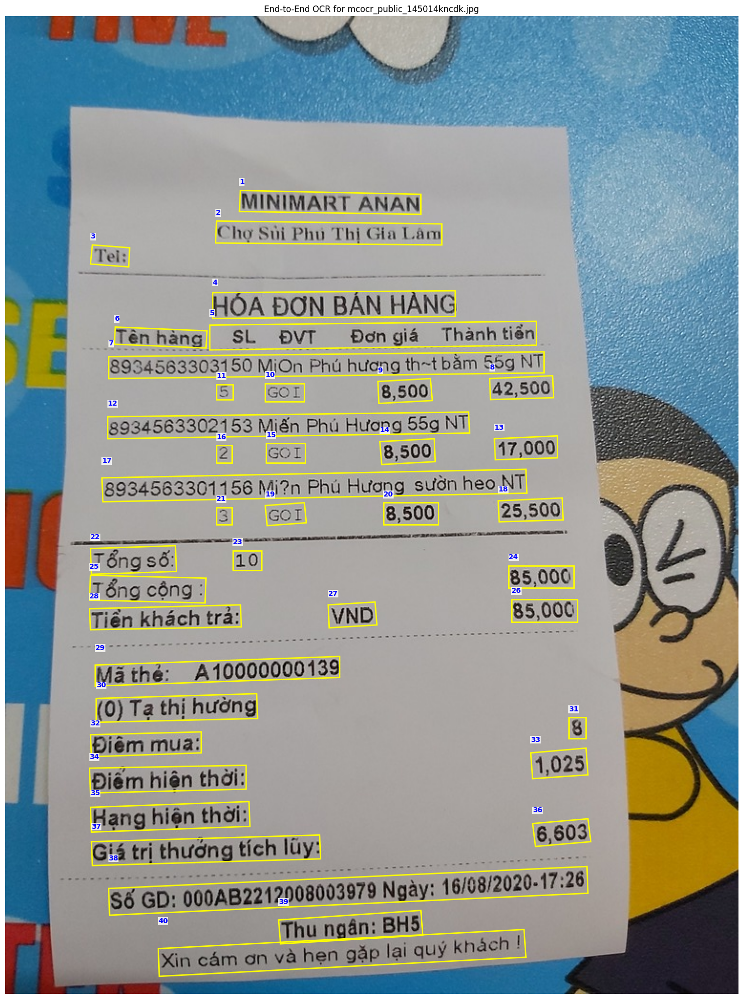


=============== Finished Image: mcocr_public_145014kncdk.jpg ===============

  Processing image: mcocr_public_145014rpmsm.jpg
    Running detection...
[2025/05/01 06:11:09] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
    Detected 34 text regions.
    Running recognition on detected regions...

--- Displaying results for 'End-to-End OCR for mcocr_public_145014rpmsm.jpg' ---

Predicted Text Output:
1: VM+ QNH 590 Trần Phú
2: Số 590 Trần Phú, P.Cẩm Thuỷ
3: VinCommerce
4: TP. Cẩm Phả, Quảng Ninh
5: 024.10650
6: 104 Dự ng án Lán
7: 110101353
8: Ngày bán: 15/08/2020 10:00
9: Ngày : 09/08/2020
10: Gio Qo tian :
11: Tang 1.8
12: 851 hàng
13: 55 Tuan
14: 07 gin
15: Ngày bán: 14/08/2020 16:00
16: 7.000
17: 8504.9506.06
18: 7.000
19: VM+ QNH Tổ 7,
20: TỔNG TIỀN PHẢI T.TOÁN
21: 7.000
22: TIỀN THÁ G Lâm
23: 00đ
24: TIỀN KHÁCH TRÀNG
25: 7.000
26: Tiền khách
27: 7.000
28: TEN DAI LY
29: 00
30: 104 Trần Phú - phường Cẩm Tây - Thành phố

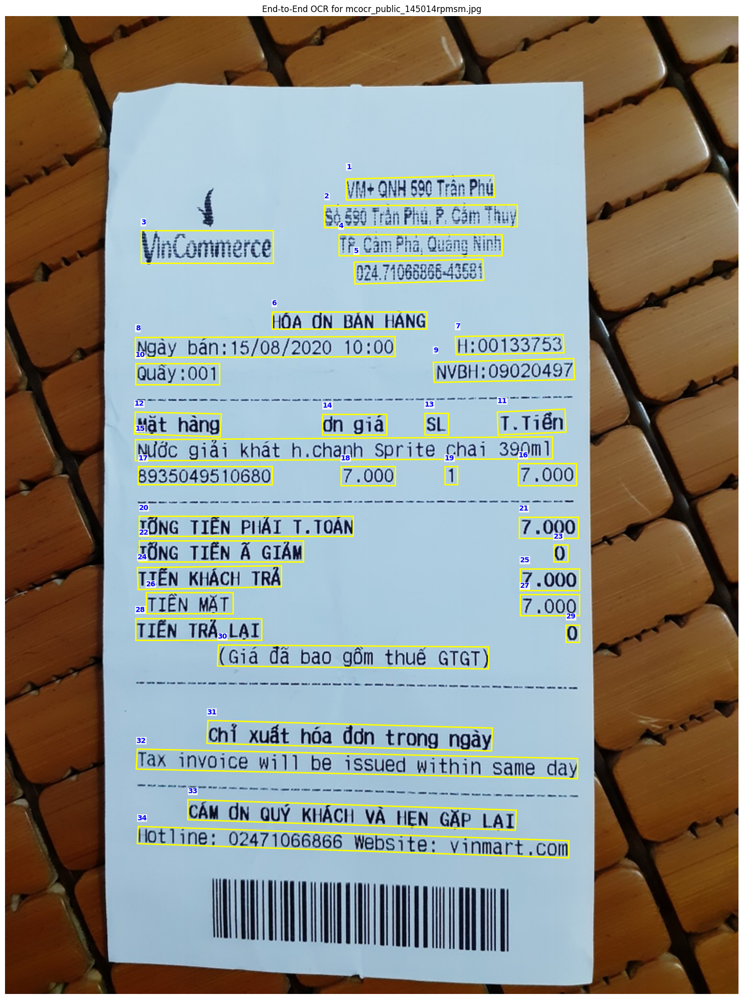


=============== Finished Image: mcocr_public_145014rpmsm.jpg ===============

  Processing image: mcocr_public_145014edrhv.jpg
    Running detection...
[2025/05/01 06:11:14] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
    Detected 55 text regions.
    Running recognition on detected regions...

--- Displaying results for 'End-to-End OCR for mcocr_public_145014edrhv.jpg' ---

Predicted Text Output:
1: Thanh toán:
2: P.Cẩm Bình, TP.Cẩm Phảm TNH
3: ĐỊA KHỈ
4: saigon co.op
5: P. Cẩm Bình, TP.Cẩm Phả
6: Giờ vào:
7: 249 Khu dinh toi
8: 89.000
9: Giờ vào
10: Vincommerce
11: Giờ ra:
12: 15-08-2020 12:44
13: 15-08-2020 13:02
14: Ngày tháng năm
15: VSHC
16: Ngày: 19/09/2020
17: 95.008
18: 18,000
19: 427,000
20: 72.000
21: Đaigon tierco.6
22: 69,000
23: Tanh Toán
24: 69.000
25: 56.200
26: Tanh Toán
27: 439,000
28: 439.000
29: Tổng
30: P Cẩm Bình TP.Cẩm Phả, QNH
31: 60,000
32: 6.000
33: Tổng cộng (đã gồm VAT)
34: 199.000
35: Tanh To

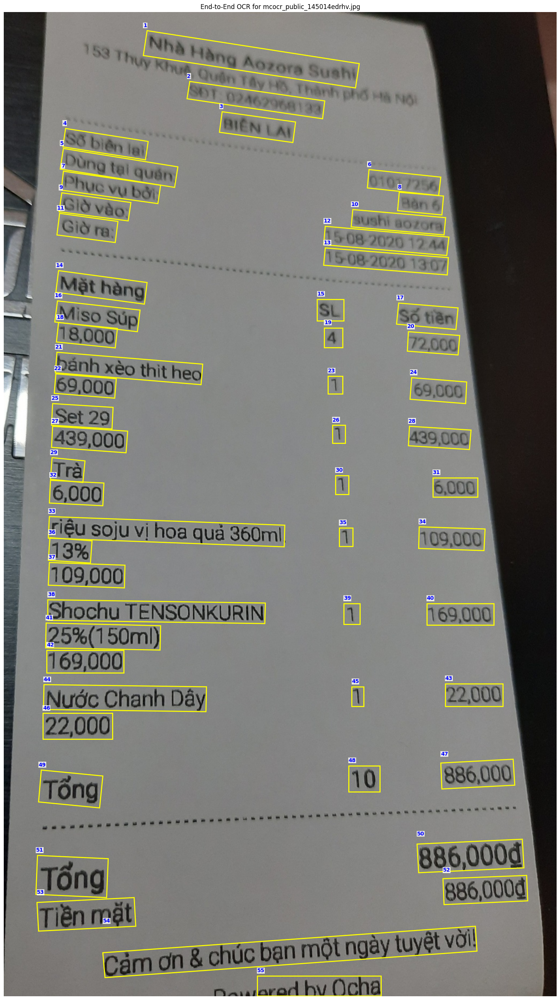


=============== Finished Image: mcocr_public_145014edrhv.jpg ===============

  Processing image: mcocr_public_145013uwdpy.jpg
    Running detection...
[2025/05/01 06:11:20] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
    Detected 37 text regions.
    Running recognition on detected regions...

--- Displaying results for 'End-to-End OCR for mcocr_public_145013uwdpy.jpg' ---

Predicted Text Output:
1: VMN QNH Tổ 7, Khu Minh Tiến A
2: Tang số thanh toán
3: Tổ 7, Khu Minh Tiến A
4: VinCommerce
5: P. Cẩm Bình, TP. Cẩm Phả, QNH
6: 024/08/2020 5:51
7: HOÁ ĐƠN MIN LOAN
8: 1.00034
9: Ngày bán: 11/08/2020 09:51
10: Ngày: 09/08/2543
11: 04.001
12: Tang 1.80
13: Giờ ra:
14: T51.00
15: 81,008
16: Du an Dau tu xay dung Khu nha o Hi Brand
17: 60.900
18: 60.900
19: 1515:5300
20: Tiền Thanh Toán
21: 121.000
22: VNĐ
23: 48.900
24: TỔNG TIỀN PHẢI T.TOÁN
25: 122.000
26: HỒNG TIẾN PHẢI T.6
27: 48.900
28: TIỀN KHÁCH TRÀ
29: 50.000
30: TIỀN K

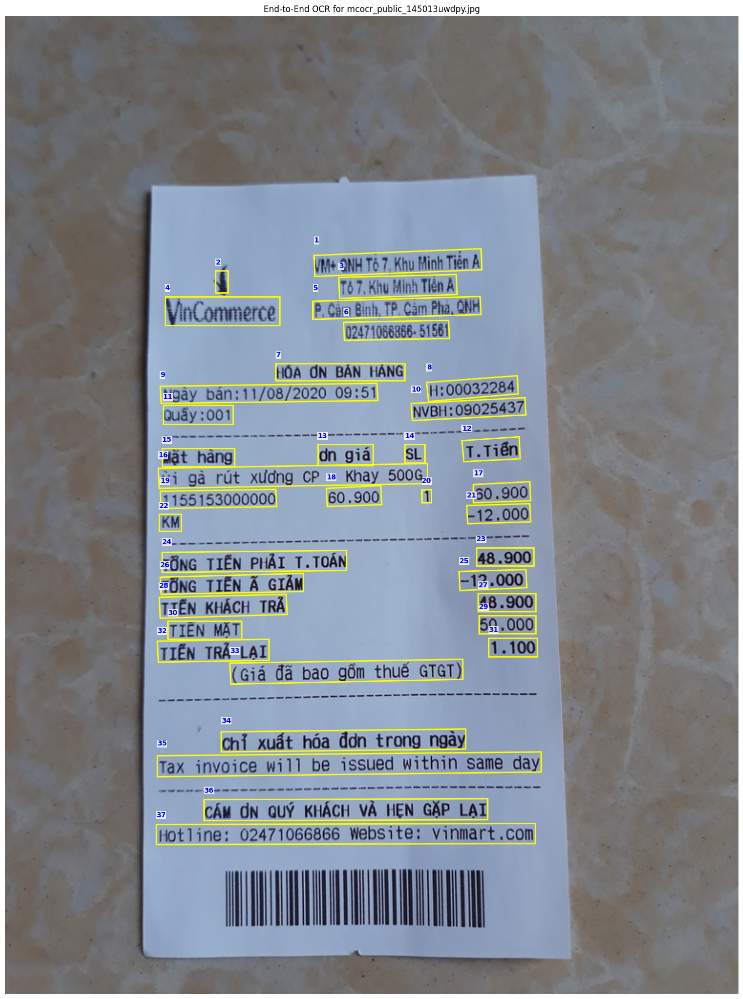


=============== Finished Image: mcocr_public_145013uwdpy.jpg ===============

  Processing image: mcocr_public_145014dhkqp.jpg
    Running detection...
[2025/05/01 06:11:25] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
    Detected 33 text regions.
    Running recognition on detected regions...

--- Displaying results for 'End-to-End OCR for mcocr_public_145014dhkqp.jpg' ---

Predicted Text Output:
1: PHỐ MỎ
2: 107 khu Tân Lập 4 - P.Cẩm Thủy
3: Tp.Cẩm Phả - Quảng Ninh
4: Đ11/0858.931931
5: HOÁ ĐƠN BÁN HÀNG
6: Số 1080 108/2020 08:26 CH
7: 13/08/2020 - 20:27
8: Ngày tháng
9: 59.07
10: Địa chỉ:
11: Địa chỉ
12: Thành tiền
13: T59
14: Địa chỉ:
15: 10.000
16: 10.000
17: VM+ QNH Tổ 7,
18: Cộng tiền hàng:
19: 10.000
20: 00
21: Chợ Khửi hàng:
22: Tổng cộng:
23: 10,000
24: Tiền khách trả
25: 10.000
26: Tiền thừan
27: 04 Trần
28: Giờ vào: 10/08/2020 07:57
29: Cộng cộng công
30: Phúc Anh Minimart
31: Giờ vào:
32: Thời gian: 09:53
33:

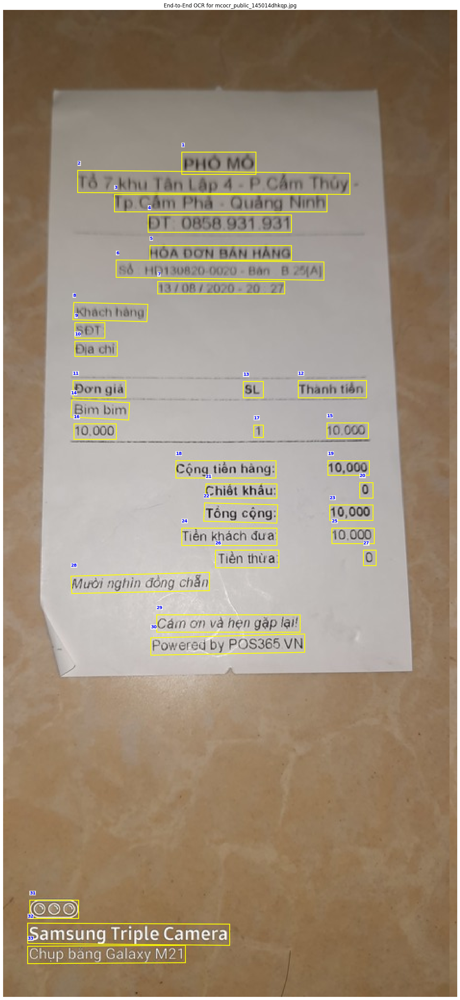


=============== Finished Image: mcocr_public_145014dhkqp.jpg ===============

--------------------------------------------------
--------------------------------------------------

--- Script Finished ---


In [ ]:
print(f"\n--- Starting End-to-End Inference and Visualization ---")

if 'model' in globals() and model is not None and 'ocr_detector' in globals() and ocr_detector is not None:
    model.eval()

    def predict_single_cropped_image(model: OCRModel, cropped_img_pil: Image.Image,
                                     device: torch.device, idx_to_char: dict,
                                     img_height: int = IMG_HEIGHT, img_width: int = IMG_WIDTH,
                                     max_len_decode: int = MAX_LEN) -> str:
        if model is None:
            return "Error: Recognition Model not loaded"
        if not isinstance(cropped_img_pil, Image.Image):
            return "Error: Input not a PIL Image"
        if cropped_img_pil.mode != 'L':
            cropped_img_pil = cropped_img_pil.convert('L')
        transform = transforms.Compose([
            transforms.Resize((img_height, img_width), interpolation=transforms.InterpolationMode.BILINEAR),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5], std=[0.5])
        ])
        img_tensor = None
        try:
            img_tensor = transform(cropped_img_pil).unsqueeze(0).to(device)
        except Exception as e:
             print(f"Error during image transform in predict_single_cropped_image: {e}")
             return f"Error: Transform failed ({e})"
        predicted_text = "Error: Prediction failed"
        if img_tensor is None: return predicted_text
        try:
            with torch.no_grad():
                memory = model.encode(img_tensor)
                ys = torch.ones(1, 1).fill_(SOS_TOKEN).long().to(device)
                ended = torch.zeros(1, dtype=torch.bool).to(device)
                for i in range(max_len_decode - 1):
                    if ended.all(): break
                    tgt_mask = model.decoder.generate_square_subsequent_mask(ys.size(0), device=device)
                    output = model.decode(ys, memory, tgt_mask=tgt_mask)
                    pred_token_idx = output[-1, :, :].argmax(dim=-1)
                    pred_token_idx = pred_token_idx.masked_fill(ended, PAD_TOKEN)
                    ys = torch.cat([ys, pred_token_idx.unsqueeze(0)], dim=0)
                    just_ended = (pred_token_idx == EOS_TOKEN)
                    ended = ended | just_ended
            predicted_indices = ys[1:, 0].cpu().tolist()
            predicted_text = decode_sequence(predicted_indices, idx_to_char)
        except Exception as e:
            print(f"Error during greedy decoding in predict_single_cropped_image: {e}")
            traceback.print_exc()
            predicted_text = "Error: Decoding exception"

        return predicted_text

    def run_end_to_end_ocr(image_path: str, recognition_model: OCRModel, device: torch.device,
                           idx_to_char: dict, detector: PaddleOCR) -> tuple[Image.Image, list[dict]]:

        img_filename = os.path.basename(image_path)
        print(f"  Processing image: {img_filename}")
        full_img_pil = None
        full_img_np = None
        image_results = []

        try:
            # Open the full original image in RGB mode for drawing
            full_img_pil = Image.open(image_path).convert('RGB')
            full_img_np = np.array(full_img_pil)
            # --- STEP 1: RUN DETECTION using PaddleOCR ---
            print("    Running detection...")
            det_results = detector.ocr(full_img_np, det=True, rec=False)

            # Process the output format from PaddleOCR Detection
            detected_polygons = []
            if det_results and isinstance(det_results, list):
                if len(det_results) == 0:
                    print("    Warning: PaddleOCR detection returned an empty list.")
                else:
                    def flatten_polygons(data):
                        polygons = []
                        if not isinstance(data, list):
                            return polygons
                        for item in data:
                            if isinstance(item, list):
                                if len(item) >= 3 and all(isinstance(point, list) and len(point) == 2 for point in item):
                                    polygons.append(item)
                                else:
                                    polygons.extend(flatten_polygons(item))
                        return polygons
                    detected_polygons = flatten_polygons(det_results)
            else:
                print("    Warning: PaddleOCR detection returned empty or unexpected result type.")
            print(f"    Detected {len(detected_polygons)} text regions.")
            if not detected_polygons:
                return full_img_pil, []

            # --- STEP 2: CROP AND RUN RECOGNITION FOR EACH DETECTED REGION ---
            print("    Running recognition on detected regions...")

            # Loop through each detected polygon
            for region_idx, region_polygon in enumerate(detected_polygons):
                try:
                    # --- Calculate Bounding Box from Detected Polygon Points ---
                    points = np.array(region_polygon, dtype=np.float32)
                    # Validation is still good practice
                    if points.ndim != 2 or points.shape[1] != 2 or points.shape[0] < 3:
                         print(f"    Skipping detected region {region_idx + 1} - invalid polygon structure.")
                         continue
                    # Get min/max x and y coordinates
                    xmin = int(np.min(points[:, 0])); ymin = int(np.min(points[:, 1]))
                    xmax = int(np.max(points[:, 0])); ymax = int(np.max(points[:, 1]))
                    # Optional: Add a small padding to the bounding box before cropping
                    padding = 2 # pixels
                    xmin = max(0, xmin - padding); ymin = max(0, ymin - padding)
                    xmax = min(full_img_pil.size[0], xmax + padding); ymax = min(full_img_pil.size[1], ymax + padding)
                    # Check for valid bbox dimensions after padding
                    if xmin >= xmax or ymin >= ymax or xmin >= full_img_pil.size[0] or ymin >= full_img_pil.size[1]:
                        print(f"    Skipping detected region {region_idx + 1} - invalid derived bbox: [{xmin},{ymin},{xmax},{ymax}]. Original points: {region_polygon}")
                        continue
                    # Crop the region from the full image
                    cropped_img_pil = full_img_pil.crop((xmin, ymin, xmax, ymax))
                    # --- Predict Text for the Cropped Region using YOUR Recognition Model ---
                    pred_text = predict_single_cropped_image(
                        recognition_model, cropped_img_pil, device, idx_to_char,
                        img_height=IMG_HEIGHT, img_width=IMG_WIDTH, max_len_decode=MAX_LEN
                    )
                    # Store the results for this region
                    image_results.append({
                        'polygon': region_polygon, # Store the detected polygon
                        'bbox': (xmin, ymin, xmax, ymax), # Store bbox (useful for sorting/fallback drawing)
                        'pred_text': pred_text,
                    })
                except Exception as e:
                    print(f"    ERROR processing detected region {region_idx + 1} for image {img_filename}: {e}")
                    traceback.print_exc()
                    bbox_val = (xmin if 'xmin' in locals() else 0, ymin if 'ymin' in locals() else 0, xmax if 'xmax' in locals() else 0, ymax if 'ymax' in locals() else 0)
                    image_results.append({
                        'polygon': region_polygon if 'region_polygon' in locals() else None,
                        'bbox': bbox_val,
                        'pred_text': "Error: Recognition failed",
                    })
            image_results.sort(key=lambda x: (x['bbox'][1], x['bbox'][0]))
            for i, res in enumerate(image_results):
                res['label_id'] = i + 1

            return full_img_pil, image_results

        except FileNotFoundError:
            print(f"  Error: Image file not found at {image_path}. Skipping.")
            return None, []
        except Exception as e:
            print(f"  Error processing image {img_filename} for end-to-end OCR: {e}.")
            traceback.print_exc()
            return full_img_pil, []

    def visualize_ocr_results(image_pil: Image.Image, results: list[dict], title: str = "OCR Results"):
         if image_pil is None or not results:
             print(f"  No results to visualize for '{title}'.")
             if image_pil is not None:
                  plt.figure(figsize=(10, 10))
                  plt.imshow(image_pil)
                  plt.title(f"{title} - No Text Detected")
                  plt.axis('off')
                  plt.show()
             return
         print(f"\n--- Displaying results for '{title}' ---")

         fig, ax = plt.subplots(1, 1, figsize=(15, 15 * image_pil.height / image_pil.width))
         ax.imshow(image_pil)
         ax.set_title(title)
         ax.axis('off')
         detection_color = 'yellow'
         label_color = 'blue'
         for result in results:
             detected_polygon = result.get('polygon')
             xmin, ymin, xmax, ymax = result['bbox']
             label_id = result['label_id']
             label_x, label_y = xmin, ymin
             if detected_polygon and isinstance(detected_polygon, list) and len(detected_polygon) >= 3:
                  try:
                      poly_points = np.array(detected_polygon, dtype=np.float32)
                      poly = Polygon(poly_points, closed=True, fill=False, edgecolor=detection_color, linewidth=2)
                      ax.add_patch(poly)
                      label_x = min(poly_points[:, 0])
                      label_y = min(poly_points[:, 1])
                  except Exception as draw_poly_err:
                       print(f"Warning: Could not draw polygon for region {label_id}: {draw_poly_err}. Falling back to bbox.")
                       rect = Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor=detection_color, facecolor='none')
                       ax.add_patch(rect)
             else:
                  rect = Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor=detection_color, facecolor='none')
                  ax.add_patch(rect)
             ax.text(label_x, label_y - 5, str(label_id), color=label_color, fontsize=10, weight='bold', verticalalignment='bottom', horizontalalignment='left', bbox=dict(facecolor='white', alpha=0.8, pad=0.5, edgecolor='none'))

         print("\nPredicted Text Output:")
         for result in results:
              label_id = result['label_id']
              pred_text = result['pred_text']
              wrapped_text = wrap(pred_text, width=100)
              print(f"{label_id}: {wrapped_text[0]}")
              if len(wrapped_text) > 1:
                  for line in wrapped_text[1:]:
                       print(f"   {line}")
         print("---------------------------")
         plt.tight_layout()
         plt.show()

    print("\n--- Running End-to-End OCR on Sample Test Images ---")
    if 'test_image_ids_for_viz' in globals() and test_image_ids_for_viz and model is not None and ocr_detector is not None:
        print(f"Selected {len(test_image_ids_for_viz)} sample test images for visualization.")
        for img_id in test_image_ids_for_viz:
            img_path = os.path.join(TRAIN_IMG_DIR, img_id)
            image_pil, detected_results = run_end_to_end_ocr(img_path, model, DEVICE, idx_to_char, ocr_detector)
            if image_pil is not None:
                 visualize_ocr_results(image_pil, detected_results, title=f"End-to-End OCR for {img_id}")
            print(f"\n{'='*15} Finished Image: {img_id} {'='*15}\n")
    else:
         print("Skipping sample test image visualization (Test set empty, no images selected, or models not loaded).")

    print("-" * 50)
else:
     print("Skipping End-to-End Inference because either Recognition Model or PaddleOCR Detector is not loaded or initialized.")

print("\n--- Script Finished ---")